У цьому ДЗ ми попрактикуємось моделювати часові ряди на даних з [Store Item Demand Forecasting Challenge](https://www.kaggle.com/competitions/demand-forecasting-kernels-only/overview). Ми будемо працювати лише з тренувальними даними цього змагання і задача у нас буде дещо змінена. Фокус буде на пошуці найкращої моделі, експериментах і використанні функціоналу `darts`.

Якщо якісно попрацювати в цьому завданні - це буде чудовий приклад проєкту для вашого портфоліо: "спрогнозував(-ла) поденні продажі на 1 міс для 50 товарів в 10 магазинах" звучить вражаюче! Але ми в рамках ДЗ для оптимізації часу сконцентруємось на моделюванні продажів одного товару в одному магазині.

**Задача**

Вам надано дані про продажі товарів у магазинах за 5 років. Хочемо навчитись передачати продажі в наступному місяці поденно кожного з 50 товарів у кожному з 10 магазинів. Відповідно будемо проводити експерименти, аби знайти найкращу модель для цього.

На відміну від змагання, ми будемо використовувати метрику МАРЕ (Mean Absolute Percentage Error) замість SMAPE (Symmetric Mean Absolute Percentage Error). Проте, ви також можете розрахувати SMAPE і подати свої результати через late submission на Kaggle.

1. Завантажуємо дані в Pandas.

  1. Завантажте дані з файлу `train.csv.zip` за допомогою бібліотеки Pandas.
  2. Перетворіть колонку `date` на формат `datetime`.
  3. Встановіть колонку `date` як індекс для датафрейму.
  4. Виведіть перші 10 рядків отриманого датафрейму та інформацію про датафрейм.

In [2]:
import pandas as pd
import numpy as np


from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


In [3]:
# Завантаження даних
df = pd.read_csv('train.csv.zip')

In [4]:
display(df.head())

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB
None


Наш датасет містить 913 000 записів та 4 стовпці.
Усі дані заповнені, пропущених значень немає.

In [6]:
# Перетворимо колонку date на формат datetime
df['date'] = pd.to_datetime(df['date'])

# Встановимо колонку date в якості індекса для датафрейму
df.set_index('date', inplace=True)

In [7]:
display(df.head())

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10


Тепер індекс датафрейму це дата, що дозволить зручніше аналізувати продажі за часом.

In [7]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 913000 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   store   913000 non-null  int64
 1   item    913000 non-null  int64
 2   sales   913000 non-null  int64
dtypes: int64(3)
memory usage: 27.9 MB
None


  2. Давайте трошки зрозуміємо дані. У нас 10 магазинів і 50 айтемів в кожному. Хочемо зрозуміти, чи відрізняється динаміка по кожному айтему в магазинах. Як би ви це візуалізували? Побудуйте 3 графіка, які вам допоможуть. Можна використати будь-який інструмент: matplotlib, seaborn, plotly.

  Напишіть висновок з побудованих вами візуалізацій.
  
    **Підказка**: я б спробувала вивести середнє значення і довірчий інтервал (який включає весь діапазон значень з різних магазинів) для динаміки кожного айтема, або принаймні для декількох айтемів, аби зрозуміти тенденцію.



In [8]:
# 1. Трендовий графік середніх продажів по магазинах
df_trend = df.groupby(["date", "store"]).sales.mean().reset_index()
fig_trend = px.line(df_trend, x="date", y="sales", color="store",
                     title="Тренд середніх продажів у кожному магазині", width=1200, height=600,
                     labels={"date": "Дата", "sales": "Середні продажі", "store": "Магазин"})
fig_trend.show()

На представленому графіку чітко видно сезонні коливання, де сплески продажів повторюються приблизно раз на рік, імовірно, через святкові періоди або сезонний попит.

Загальний тренд свідчить про поступове збільшення середніх продажів з 2013 до 2017 року.

Помітна також різниця між магазинами: деякі магазини мають значно більший внесок у загальні продажі (наприклад, магазин №10, позначений жовтим кольором).

In [12]:
import plotly.express as px

fig = px.box(df[df["item"].isin([1, 2, 3, 4, 5])], x="store", y="sales", color="item",
             title="Розподіл продажів вибраних товарів у різних магазинах")

fig.show()

Графік показує розподіл продажів вибраних 5 товарів (item 1-5) у різних магазинах (store 1-10), тобто розподіл продажів кожного товару в кожному магазині.

Дивлячись на побудовані боксплоти можна зробити наступні висновки:


Продажі товару 2 (червоні боксплоти) значно вищі у всіх магазинах порівняно з іншими товарами.

Розкид продажів сильно відрізняється між магазинами.

Деякі товари продаються стабільніше – наприклад, item 4 (фіолетовий) має відносно менший розкид, ніж item 2.

Викиди є майже у всіх категоріях, особливо у item 2, що може свідчити про періоди пікового попиту або великі замовлення.

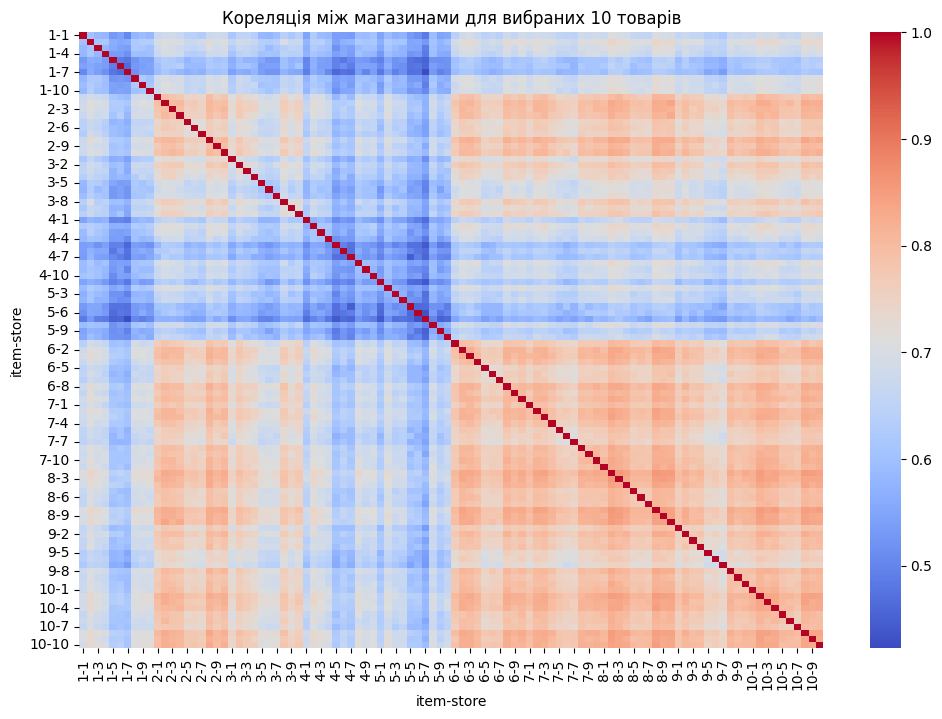

In [13]:
import plotly.express as px
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Вибір 10 товарів
selected_items = df["item"].unique()[:10]
df_filtered = df[df["item"].isin(selected_items)]

# Обчислення середніх продажів по магазинах для кожного товару
df_pivot = df_filtered.pivot_table(index="date", columns=["item", "store"], values="sales", aggfunc="mean")

# Обчислення кореляційної матриці
corr_matrix = df_pivot.corr()

# Візуалізація кореляційної матриці
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False)
plt.title("Кореляція між магазинами для вибраних 10 товарів")
plt.show()


На графіку представлена кореляційна матриця продажів 10 вибраних товарів у різних магазинах.

По осях X та Y розташовані пари товар-магазин у форматі item-store (наприклад, "1-1" означає товар 1 у магазині 1).

Висновки:


Є групи з високою кореляцією (червоні області). Це свідчить про те, що продажі деяких товарів у певних магазинах змінюються схожим чином. Це може вказувати на однакові закупівельні тренди або подібну сезонність.

Деякі магазини показують слабку або негативну кореляцію (сині області), що означає, що їхні продажі не залежать один від одного. Це може бути пов'язано з різними стратегічними локаціями магазинів або різною цільовою аудиторією.

Є чітко виражені блоки кореляцій— наприклад, певні групи товарів мають схожу динаміку у певних магазинах.

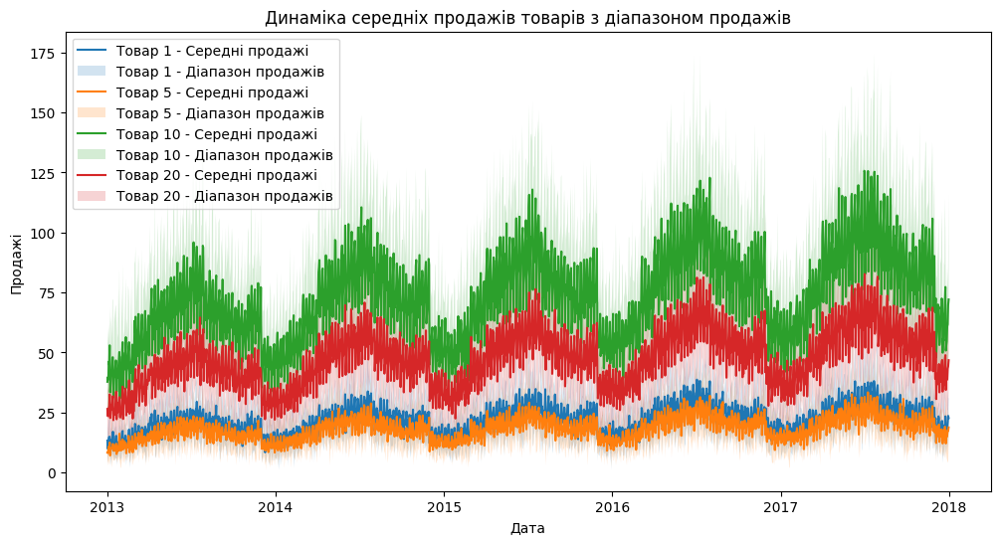

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Список товарів, для яких ми хочемо побудувати графік
items_to_include = [1, 5, 10, 20]

# Фільтрація даних по вказаним товарам
df_filtered = df[df["item"].isin(items_to_include)]

# Підготовка даних для кожного товару
plt.figure(figsize=(12, 6))

for item in items_to_include:
    item_data = df_filtered[df_filtered["item"] == item]

    # Розрахунок середніх продажів для кожного товару
    item_mean_sales = item_data.groupby("date")["sales"].mean()

    # Розрахунок мінімальних і максимальних продажів для кожного товару
    item_min_sales = item_data.groupby("date")["sales"].min()
    item_max_sales = item_data.groupby("date")["sales"].max()

    # Побудова лінії для середніх продажів
    sns.lineplot(x=item_mean_sales.index, y=item_mean_sales, label=f"Товар {item} - Середні продажі")

    # Заповнення області між мінімальними та максимальними значеннями продажів
    plt.fill_between(item_mean_sales.index,
                     item_min_sales,
                     item_max_sales,
                     alpha=0.2, label=f"Товар {item} - Діапазон продажів")

# Налаштування графіку
plt.title("Динаміка середніх продажів товарів з діапазоном продажів")
plt.xlabel("Дата")
plt.ylabel("Продажі")
plt.legend()
plt.show()


Графік відображає динаміку середніх продажів вибраних товарів (Товар 1, 5, 10, 20) у часі. Для кожного товару показано:

Середні продажі у вигляді лінії.

Діапазон продажів (мінімальні та максимальні значення) як заштрихована область.

Висновки про динаміку продажів:
Бачимо сезонність – спостерігаються регулярні піки та спади кожного року, що свідчить про вплив сезонних факторів на продажі.

Серед наведених айтемів Товар 10 має найвищі середні продажі, що видно по його зеленій лінії та широкому діапазону змін.

Товари 1, 5 і 20 мають нижчий рівень продажів, але також демонструють схожу сезонну динаміку.

Коливання продажів (заштриховані області) суттєві, що свідчить про нестабільний попит або залежність продажів від певних зовнішніх чинників.

Загальний тренд продажів залишається стабільним із невеликим зростанням.

In [ ]:
# Побудуємо графік середніх продажів з довірчим інтервалом для кожного товару по всіх магазинах
item_sales_avg = df.groupby(['date', 'item'])['sales'].agg(['mean', 'std']).reset_index()

fig2 = go.Figure()

# Додаємо лінії середнього значення
for item in item_sales_avg['item'].unique():
    item_data = item_sales_avg[item_sales_avg['item'] == item]
    fig2.add_trace(go.Scatter(x=item_data['date'], y=item_data['mean'],
                             mode='lines', name=f'Item {item} Mean'))

    # Додаємо довірчий інтервал (стандартне відхилення)
    fig2.add_trace(go.Scatter(x=item_data['date'], y=item_data['mean'] - item_data['std'],
                             fill=None, mode='lines', line=dict(width=0),
                             showlegend=False))
    fig2.add_trace(go.Scatter(x=item_data['date'], y=item_data['mean'] + item_data['std'],
                             fill='tonexty', mode='lines', line=dict(width=0),
                             showlegend=False))

fig2.update_layout(title="Середні продажі з довірчим інтервалом для всіх товарів",
                   xaxis_title="Date", yaxis_title="Sales")
fig2.show()


Графік показує середні продажі товарів у часі з відображенням довірчого інтервалу (стандартного відхилення). Кожен товар представлений окремою лінією, що демонструє зміну середніх продажів. Навколо кожної лінії видно заштриховану область, яка позначає діапазон можливих коливань (від середнього значення ± стандартне відхилення).

З графіка чітко видно сезонність продажів – кожного року спостерігаються періоди підйому та спаду. Також помітно, що рівень середніх продажів різних товарів значно відрізняється: деякі товари мають стабільно вищий рівень продажів, тоді як інші мають менші обсяги реалізації.

Високий рівень коливань – довірчий інтервал досить широкий для багатьох товарів, що вказує на значні відмінності в продажах між магазинами або різні фактори, що впливають на попит.

Загальне зростання продажів – помітно, що загальний рівень продажів поступово зростає протягом досліджуваного періоду, що може свідчити про розширення ринку або збільшення попиту.

3. **Для початку проаналізуємо лише один ряд, а далі зможемо зациклити тренування моделей.**
  
  Виберіть підмножину даних, що відповідає продажам товару з `item == 1` у магазині з `store == 1`.

  Зробіть декомпозицію цього рядку за адитивною моделлю на тренд, сезонність і залишки з бібліотекою `statsmodels`.

  Зробіть висновки з отриманих візуалізацій. Чи щось би могло вам допомогти ліпше зрозуміти ці візуалізації? (з точки зору обробки даних)

In [8]:
import statsmodels.api as sm


filtered_data = df[(df['item'] == 1) & (df['store'] == 1)]

In [9]:
filtered_data

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,1,1,14
2017-12-28,1,1,19
2017-12-29,1,1,15


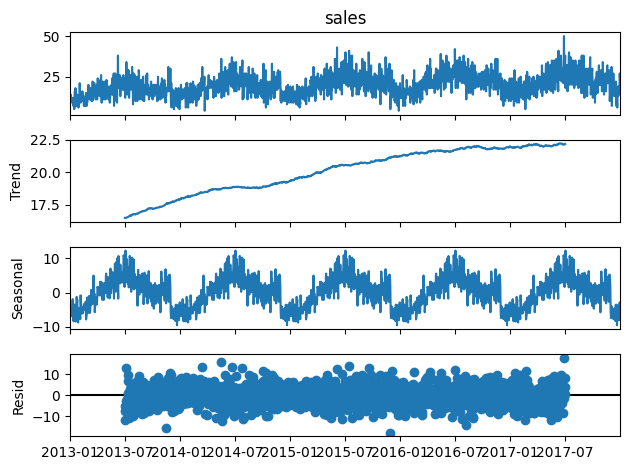

In [17]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition_additive = seasonal_decompose(filtered_data['sales'], model='additive', period=365)

# Візуалізація декомпозиції
decomposition_additive.plot()
plt.show()


Графік показує декомпозицію часового ряду продажів на три основні компоненти:

Верхній графік (sales) – вихідний часовий ряд продажів, який містить усі коливання.

Trend (Тренд) - видно, що загальний тренд зростає, тобто середні продажі поступово збільшуються.

Seasonal (Сезонність) – графік демонструє сезонну циклічність, що повторюється щорічно.

Resid (Залишки) – випадкові коливання, які не підпорядковуються тренду або сезонності.

Висновки:


Продажі зростають у довгостроковій перспективі, що видно з висхідного тренду.

Яскраво виражена сезонність – продажі коливаються протягом року, ймовірно, через попит у певні місяці.

Залишки зосереджені навколо нуля і не мають чіткої структури, що свідчить про наявність випадкових факторів, які впливають на продажі.

Щоб ліпше зрозуміти візуалізації слід зробити додаткові тести на сезонність та стаціонарність.



4. Зі створеної підможени даних в попередньому пункті створіть обʼєкт класу `TimeSeries` в `darts` лише для колонки `sales`.

In [11]:
!pip install darts --quiet

In [12]:
from darts import TimeSeries

In [13]:
# Завантаження даних в darts
series = TimeSeries.from_dataframe(filtered_data, value_cols='sales')

In [11]:
series

<TimeSeries (DataArray) (date: 1826, component: 1, sample: 1)> Size: 15kB
array([[[13.]],

       [[11.]],

       [[14.]],

       ...,

       [[15.]],

       [[27.]],

       [[23.]]])
Coordinates:
  * date       (date) datetime64[ns] 15kB 2013-01-01 2013-01-02 ... 2017-12-31
  * component  (component) <U5 20B 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
    metadata:           None

<Axes: xlabel='date'>

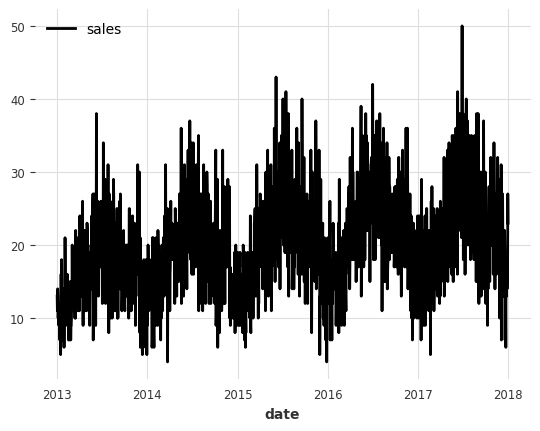

In [12]:
series.plot()

За допомогою методу TimeSeries.from_dataframe(), ми перетворили filtered_data у формат TimeSeries.

Значення sales використовуються як основний часовий ряд.


5. Використовуючи метод `series.split_before` розбийте дані на тренування і валідацію так, аби валідація починалась з `2017-10-01` включно.

  Візуалізуйте на одному графіку тренувальну і валідаційну частину як було показано в лекції.

<Axes: xlabel='date'>

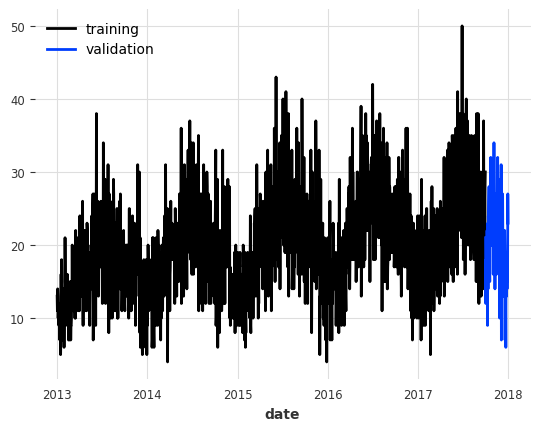

In [14]:
# Розбиваємо дані на тренувальні та валідаційні
train, val = series.split_before(pd.Timestamp('2017-10-01'))
train.plot(label="training")
val.plot(label="validation")

За допомогою методу .split_before(pd.Timestamp('2017-10-01')), ми розділили дані на:

Train (Тренувальна вибірка): дані до 1 жовтня 2017

Validation (Валідаційна вибірка): дані після 1 жовтня 2017


На графіку видно, що основна частина даних використовується для навчання моделі, а останні три місяці (жовтень–грудень 2017) виділені для перевірки її точності. Це дозволить оцінити, наскільки добре модель справляється з прогнозуванням на нових даних.



6. Побудуйте часткову автокореляційну фукнцію для цього нашого ряду в `series`. Напишіть висновки - які лаги є важливими для прогнозування?

<Figure size 1000x600 with 0 Axes>

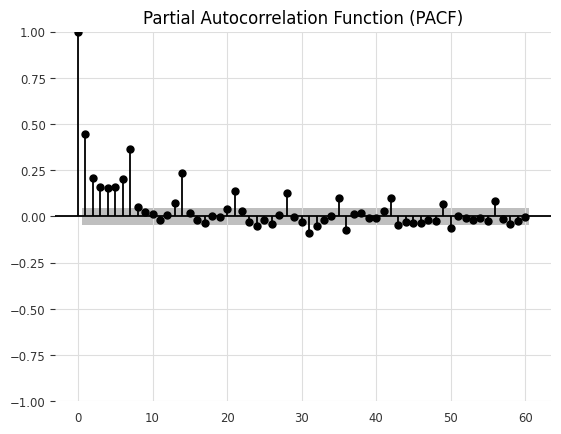

In [14]:
from statsmodels.graphics.tsaplots import plot_pacf

# Побудова часткової автокореляційної функції
plt.figure(figsize=(10, 6))
plot_pacf(series.values(), lags=60, method='ywm')
plt.title("Partial Autocorrelation Function (PACF)")
plt.show()



На основі графіка часткової автокореляційної функції (PACF) можна зробити такі висновки:

Lag 1 — найвищий, що означає, що найближче минуле (попереднє значення) має сильний вплив.

Lags 2–5 — теж виходять за межі довірчого інтервалу і теж мають помітну часткову автокореляцію.

Lag 7 — можливий тижневий патерн (оскільки наші дані є поденними).

Lag 14, 21 — деякі сплески, які можуть вказувати на періодичність.

Подальші лаги стають ближчими до нуля, що вказує на зменшення впливу попередніх значень на поточне.


7. Виявіть сезональність тренувального ряду використовуючи фукнкцію `check_seasonality` з `darts`.

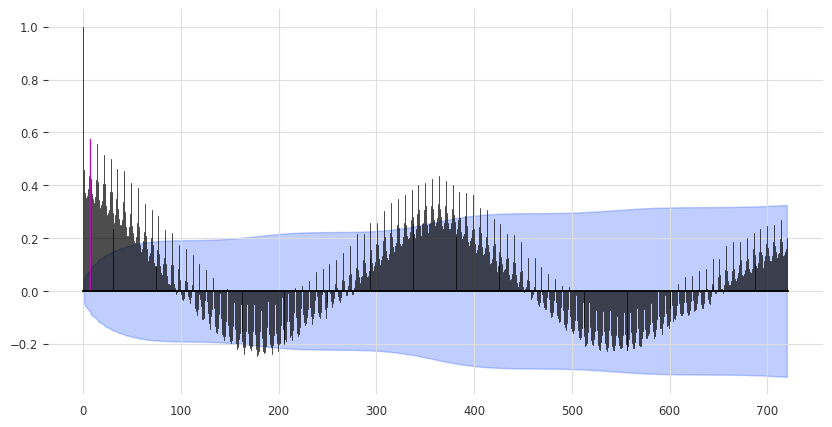

In [15]:
from darts.utils.statistics import plot_acf, check_seasonality

plot_acf(train, m=7, alpha=0.05, max_lag=720)

На графіку автокореляційної функції (ACF) ми можемо побачити періодичний патерн — графік має синусоїдальну форму, що вказує на наявність сезонності в даних.

Перший сильний пік біля лагу 7 — підтверджує тижневу сезонність.

Більші пікоподібні зони біля значень 350 і 700 можуть свідчити про річну сезонність (~365 днів).


Висновки:


Дані мають тижневу (7 днів) і річну (~365 днів) сезонність.


In [15]:
from darts.utils.statistics import check_seasonality

# Перевірка сезонності
is_seasonal, period = check_seasonality(train, max_lag=365)

# Виведемо результати
if is_seasonal:
    print("There is seasonality of order {}.".format(period))


There is seasonality of order 7.


Аналіз сезонності за допомогою фукнкціі check_seasonality показує, що дані мають тижневу сезонність із періодом 7 днів. Це означає, що значення часового ряду повторюються кожні 7 днів, що логічно для даних, пов’язаних із продажами.

8. Побудуйте наївну модель NaiveSeasonal + NaieDrift для прогнозування даних. Кількість кроків для прогнозування визначіть зі свого аналізу в попередніх пунктах. Візуалізайте передбачення проти справжніх даних так, аби було видно якість передбачень. Зробіть висновок про модель. Вона точна?

  Якщо у вас є ідеї, як поліпшити якість передбачення саме наївними моделями - реалізуйте їх в цьому пункті :)

In [16]:
from darts.models import NaiveSeasonal, NaiveDrift
import matplotlib.pyplot as plt

In [17]:
forecast_horizon = len(val)
forecast_horizon

92

<Axes: xlabel='date'>

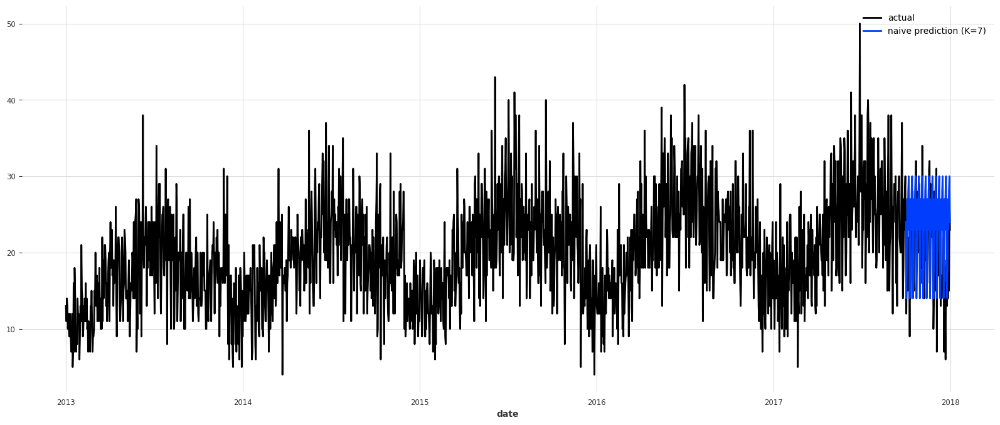

In [18]:
seasonal_model = NaiveSeasonal(K=7)
seasonal_model.fit(train)
seasonal_forecast = seasonal_model.predict(forecast_horizon)

plt.figure(figsize=(20, 8))

series.plot(label="actual")
seasonal_forecast.plot(label="naive prediction (K=7)")

In [19]:
from darts.metrics import mape

print(
    f"Mean absolute percentage error for seasonal_forecast: {mape(series, seasonal_forecast):.2f}%."
)

Mean absolute percentage error for seasonal_forecast: 38.17%.


Горизонт прогнозу у нас складає 92 дні.

При створенні NaiveSeasonal моделі ми використали NaiveSeasonal(K=7) згідно з результатами тесту сезонності з нашого попереднього завдання, що означає тижневу сезонність.

На графіку показано фактичні значення (actual) та прогноз від NaiveSeasonal.

Ми також обчислили середню абсолютну відносну помилку (MAPE), що складає 38.17%, що означає, що модель не дає хорошого прогнозу.


Модель погано враховує тренд, тому в наступних кроках використаємо NaiveDrift для врахування тренду.

Також побудуємо модель з К=365, оскільки наші дані мають тижневу і річну сезонність.


<Axes: xlabel='date'>

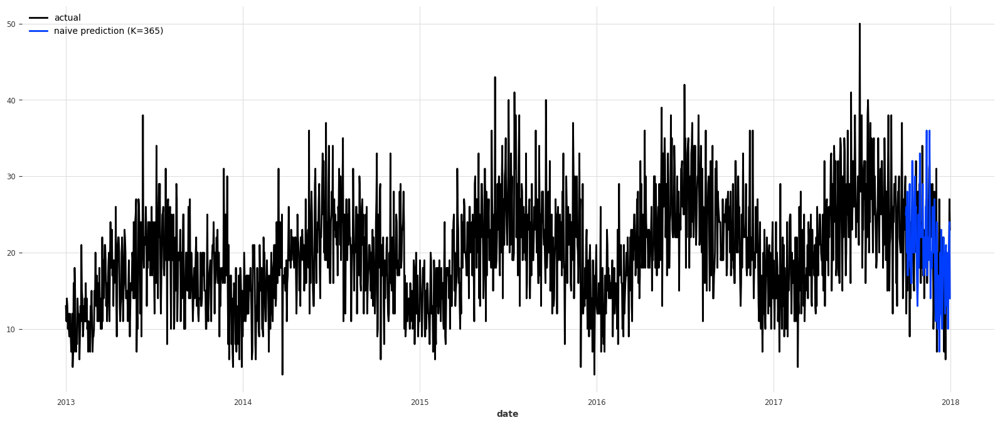

In [21]:
seasonal_model_annual = NaiveSeasonal(K=365)
seasonal_model_annual.fit(train)
seasonal_forecast_annual = seasonal_model_annual.predict(92)

plt.figure(figsize=(20, 8))

series.plot(label="actual")
seasonal_forecast_annual.plot(label="naive prediction (K=365)")

In [22]:
print(
    f"Mean absolute percentage error for seasonal_forecast_annual: {mape(series, seasonal_forecast_annual):.2f}%."
)

Mean absolute percentage error for seasonal_forecast_annual: 33.92%.


Ми змінили значення параметру K=365, щоб побачити чи кращий буде прогноз при врахуванні річної сезонності.



Ми можемо відмітити поліпшення точності моделі - MAPE знизився з 38.17% до 33.92%, що свідчить про краще врахування сезонних патернів.

На даному етапі модель все ще не враховує тренд.

Спробуємо комбіновану модель, що враховує і короткострокову (K=7), і довгострокову (K=365) сезонність та використаємо NaiveDrift, яка прогнозує лінійний тренд.

<Axes: xlabel='date'>

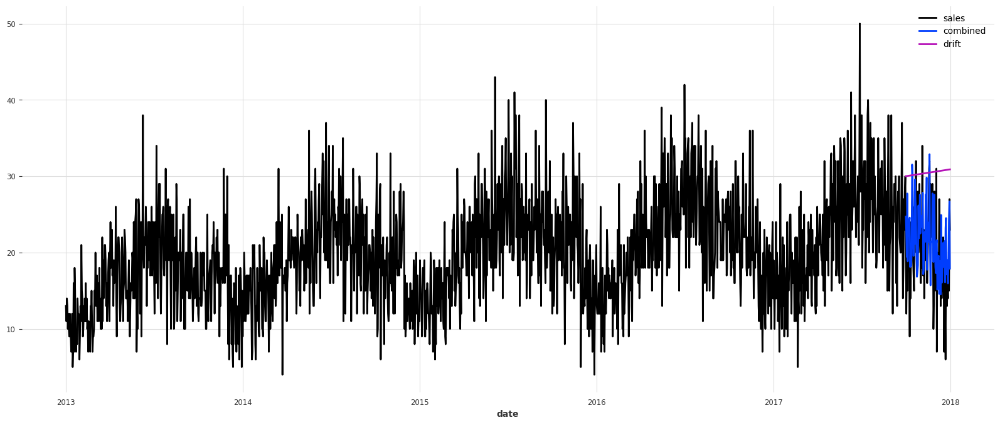

In [23]:
from darts.models import NaiveDrift

drift_model = NaiveDrift()
drift_model.fit(train)
drift_forecast = drift_model.predict(forecast_horizon)

combined_forecast = drift_forecast + 0.7*seasonal_forecast_annual + 0.3*seasonal_forecast - train.last_value()

plt.figure(figsize=(20, 8))

series.plot()
combined_forecast.plot(label="combined")
drift_forecast.plot(label="drift")

Ми побудували комбіновану модель де використали вагові коефіцієнти для комбінації:

70% для річної сезонності (0.7) – основний вплив

30% для тижневої сезонності (0.3) – допоміжний вплив

та додали NaiveDrift для врахування тренду.



9. Обчисліть помилку прогнозу на валідації наївною моделлю з mape. Далі для всіх моделей необхідно обчислювати помилку прогнозу на валідації.

In [ ]:
from darts.metrics import mape

print(
    f"Mean absolute percentage error for the combined naive drift + seasonal: {mape(series, combined_forecast):.2f}%."
)

Mean absolute percentage error for the combined naive drift + seasonal: 30.08%.


MAPE для комбінованої моделі (Naïve Drift + Seasonal)становить 30.08%

Це кращий результат, ніж для окремих сезонних моделей.

Комбінований підхід з додаванням тренду за допомогою Naive Drift до річної та тижневої сезонності допомогло знизити помилку та отримати кращий прогноз.

Помилка все ще досить висока і модель має потенціал для покращення.

10. Натренуйте XBGModel з `darts` для передбачення наших даних. Можна додавати всі додаткові ознаки, які вважаєте за потрібне, наприклад, ознаки з дати. Зробіть висновок про якість моделі.

In [24]:
from darts.models import XGBModel
from darts.dataprocessing.transformers import Scaler

def enrich_with_date_features(df):
  df["dayofweek"] = df['date'].dt.dayofweek
  df["month"] = df['date'].dt.month
  df["year"] = df['date'].dt.year
  df["dayofyear"] = df['date'].dt.dayofyear
  df["sin_day"] = np.sin(df["dayofyear"])
  df["cos_day"] = np.cos(df["dayofyear"])
  df["dayofmonth"] = df['date'].dt.day
  return df

# Додавання ознак дати
train_transformed = enrich_with_date_features(train.pd_dataframe().reset_index())
val_transformed = enrich_with_date_features(val.pd_dataframe().reset_index())



In [25]:
from darts.models import XGBModel
from darts import TimeSeries


# Створюємо TimeSeries для цільової змінної (sales) та часових ознак
train_series = TimeSeries.from_dataframe(train_transformed, time_col='date', value_cols='sales')
val_series = TimeSeries.from_dataframe(val_transformed, time_col='date', value_cols='sales')

train_covariates = TimeSeries.from_dataframe(train_transformed.drop(columns=["sales"]), time_col='date')
val_covariates = TimeSeries.from_dataframe(val_transformed.drop(columns=["sales"]), time_col='date')



In [26]:
from darts.dataprocessing.transformers import Scaler

# Масштабування даних для цільової змінної
scaler_target = Scaler()
train_transformed_scaled = scaler_target.fit_transform(train_series)
val_transformed_scaled = scaler_target.transform(val_series)

# Масштабування коваріатів (часових ознак)
scaler_covariates = Scaler()
train_covariates_scaled = scaler_covariates.fit_transform(train_covariates)
val_covariates_scaled = scaler_covariates.transform(val_covariates)

In [27]:
# Побудова моделі XGBoost
model_xgb = XGBModel(
    lags=7,
    lags_future_covariates=[0],
    random_state=42,
    output_chunk_length=1,  # Прогнозування на 1 крок вперед
    n_estimators=100,  # Кількість дерев у моделі
    max_depth=3,  # Максимальна глибина кожного дерева
    learning_rate=0.1,  # Коефіцієнт навчання
    subsample=0.8,  # Частка даних для випадкової вибірки кожного дерева
    colsample_bytree=0.8
)

# Навчання моделі з масштабованими коваріатами
model_xgb.fit(train_transformed_scaled, future_covariates=train_covariates_scaled)

# Прогнозування на валідаційних даних з масштабованими коваріатами
forecast_scaled = model_xgb.predict(n=len(val_series), future_covariates=val_covariates_scaled)

# Інвертуємо масштабування для прогнозу
forecast = scaler_target.inverse_transform(forecast_scaled)


In [28]:
# Оцінка прогнозу
mape_XGB = mape(val, forecast)
print(f"MAPE для XGBModel: {mape_XGB:.2f}%")

MAPE для XGBModel: 22.19%


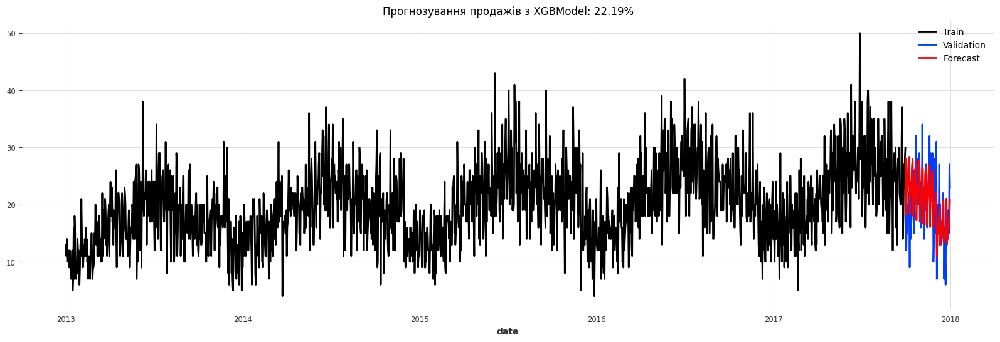

In [29]:
# Візуалізація результатів
plt.figure(figsize=(20, 6))
train_series.plot(label='Train')
val_series.plot(label='Validation')
forecast.plot(label='Forecast', color='red')
plt.title(f"Прогнозування продажів з XGBModel: {mape_XGB:.2f}%")
plt.legend()
plt.show()

Ми додали часові ознаки, здійснили масштабування даних перед передачею в XGBoost та використовуємо 7 лагів (тиждень історії).

Лаги для коваріатів [0] означають, що беремо поточні значення часових ознак.

MAPE становить 22.19% і це значно краще, ніж базові моделі (Naive Drift + Seasonal ≈ 30.08%).

Висновок:
XGBoost працює краще, ніж наївні підходи.
Використання часових ознак (covariates) значно покращує точність.

11. Натренуйте модель ExponentialSmoothing та зробіть висновок про її якість.

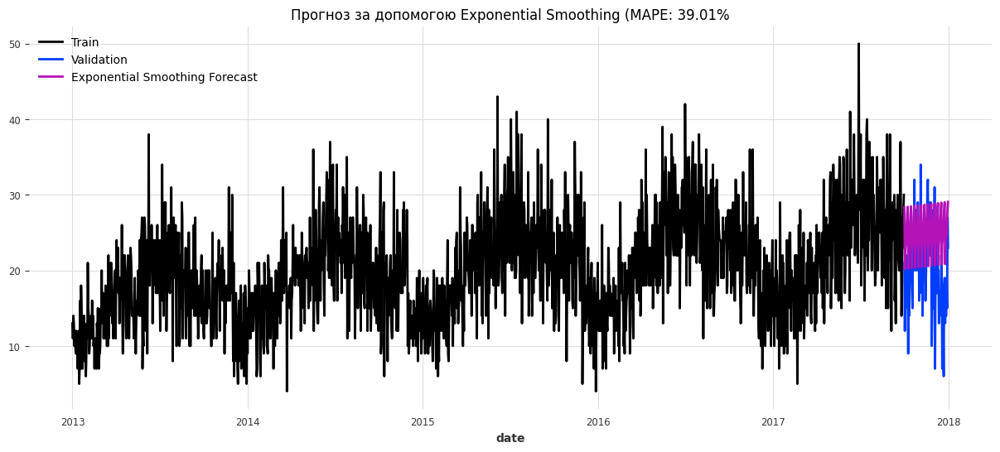

MAPE: 39.01%


In [30]:
from darts.models import ExponentialSmoothing

# Створюємо та навчаємо модель
model = ExponentialSmoothing()
model.fit(train)

# Прогнозуємо на валідаційний період
forecast = model.predict(len(val))

# Оцінка якості
mape_score = mape(val, forecast)

# Візуалізація прогнозу
plt.figure(figsize=(15, 6))
train_series.plot(label="Train")
val_series.plot(label="Validation")
forecast.plot(label="Exponential Smoothing Forecast")
plt.legend()
plt.title(f"Прогноз за допомогою Exponential Smoothing (MAPE: {mape_score:.2f}%")
plt.show()

# Виводимо результати оцінки
print(f"MAPE: {mape_score:.2f}%")



Ми натренували базову модель Exponential Smoothing даних без сезонності.

MAPE = 39.01% (низька точність).

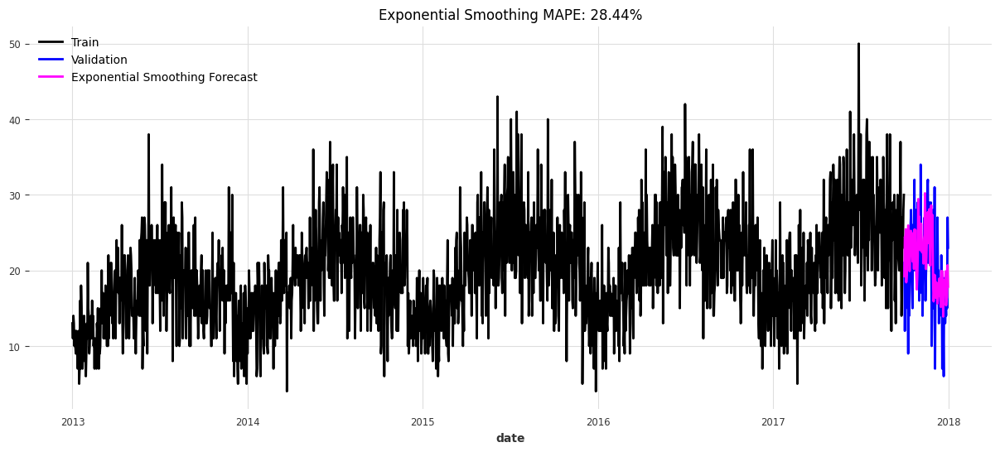

MAPE: 28.44%


In [ ]:
from darts.models import ExponentialSmoothing

# Покращена модель Exponential Smoothing з урахуванням річної сезонності
model = ExponentialSmoothing(seasonal_periods=365)
model.fit(train_series)

# Прогноз
forecast = model.predict(len(val_series))

# Оцінка якості
mape_score = mape(val_series, forecast)


# Візуалізація
plt.figure(figsize=(15, 6))
train_series.plot(label="Train", color="black")
val_series.plot(label="Validation", color="blue")
forecast.plot(label="Exponential Smoothing Forecast", color="magenta")
plt.legend()
plt.title(f"Exponential Smoothing MAPE: {mape_score:.2f}%")
plt.show()

# Вивід метрик
print(f"MAPE: {mape_score:.2f}%")



Ми змодифікували нашу модель Exponential Smoothing і додали параметр seasonal_periods=365 (річна сезонність).

MAPE покращився до 28.44%.


ДЛя покращення прогнозу можна також дослідити інші сезонні періоди або
використати Exponential Smoothing у складі ансамблевих моделей.


Висновок: Додавання сезонності помітно покращило прогноз, але для кращої точності варто досліджувати складніші моделі.

12. Натренуйте модель ARIMA, параметри оберіть самостійно.Зробіть висновок про її якість.

In [31]:
from darts.models import ARIMA
# Створюємо та навчаємо ARIMA
model_arima = ARIMA(p=4, d=1, q=5)


# Навчання моделі на тренувальному наборі
model_arima.fit(train)

# Прогнозування
forecast_arima = model_arima.predict(len(val))

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [32]:
# Обчислення MAPE
mape_score = mape(val, forecast_arima)

# Вивід метрики
print(f"MAPE (ARIMA): {mape_score:.2f}%")

MAPE (ARIMA): 38.13%


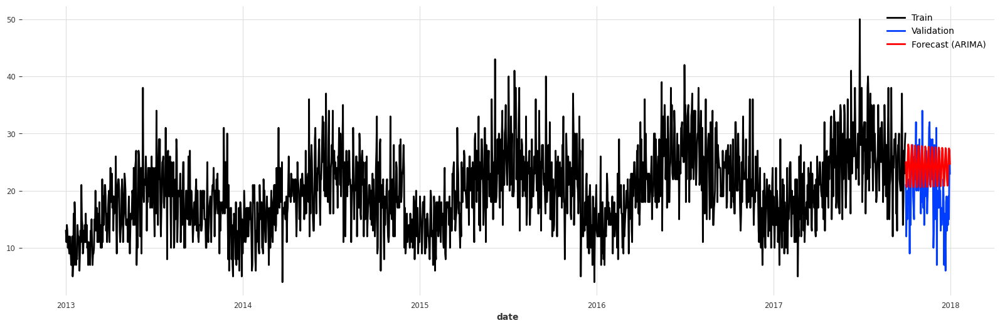

In [33]:
plt.figure(figsize=(20, 6))
train.plot(label="Train")
val.plot(label="Validation")
forecast_arima.plot(label="Forecast (ARIMA)", color="red")
plt.legend()
plt.show()

Ми побудували модель ARIMA з параметрами:

p=4 – враховує автокореляцію до 4-го лагу

d=1 – дані були диференційовані 1 раз

q=5 - модель враховує останні 5 значень випадкових коливань(шуму) для корекції поточного прогнозу.


MAPE 38.13% свідчить, що модель дає велику похибку.


Спробуємо здійснити автоматичний підбір параметрів за допомогою auto_arima в наступному кроці.

13. Знайдіть оптимальні параметри моделі ARIMA з допомогою AutoARIMA моделі. Виконайте пошук параметрів, виведіть, які паарметри виявились оптимальними і обчисліть якість моделі. Чи поліпшилась якість порівняно з попереднім експериментом?

In [34]:
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_percentage_error


In [35]:
train_series_df = train.pd_dataframe()
weekdays_dummies = pd.get_dummies(train_series_df.index.dayofweek, prefix='weekday')
weekdays_dummies = weekdays_dummies.astype(int)

In [37]:
year = train_series_df.index.dayofyear
X_yearly = pd.DataFrame({
    'sin_year': np.sin(2 * np.pi * year / 365),  # Синус для річної сезонності
    'cos_year': np.cos(2 * np.pi * year / 365)   # Косинус для річної сезонності
})

# Об'єднуємо екзогенні змінні (дні тижня та річні гармоніки)
exog = pd.concat([weekdays_dummies, X_yearly], axis=1)

In [38]:
# 3. Створення моделі з екзогенними змінними
auto_model = auto_arima(train.values(),
                        seasonal=True,
                        m=7,  # Тижнева сезонність
                        trace=True,
                        suppress_warnings=True,
                        exog=exog)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : AIC=inf, Time=10.34 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=11699.312, Time=0.07 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=11207.039, Time=0.94 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=10659.514, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=11697.315, Time=0.10 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=10763.373, Time=1.53 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=6.13 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,2)[7] intercept   : AIC=10587.183, Time=2.42 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=19.11 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,0)(0,0,2)[7] intercept   : AIC=11549.258, Time=1.73 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=10580.615, Time=3.09 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=10652.927, Time=1.66 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=12.30 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=9.30 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(0,0,2)[7] intercept   : AIC=11181.391, Time=1.65 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,2)[7] intercept   : AIC=10578.999, Time=3.39 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,1)[7] intercept   : AIC=10648.553, Time=2.31 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=14.47 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=8.97 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,0)(0,0,2)[7] intercept   : AIC=11010.974, Time=2.02 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,2)[7] intercept   : AIC=10577.067, Time=5.64 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,1)[7] intercept   : AIC=10641.754, Time=2.74 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(1,0,2)[7] intercept   : AIC=10368.395, Time=15.30 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=10.99 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(2,0,2)[7] intercept   : AIC=inf, Time=19.11 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(2,0,1)[7] intercept   : AIC=inf, Time=16.40 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,0)(1,0,2)[7] intercept   : AIC=inf, Time=18.99 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=18.55 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,2)(1,0,2)[7] intercept   : AIC=inf, Time=19.57 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,0)(1,0,2)[7] intercept   : AIC=inf, Time=9.20 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(1,0,2)[7] intercept   : AIC=inf, Time=21.17 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,0)(1,0,2)[7] intercept   : AIC=inf, Time=13.78 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(4,1,2)(1,0,2)[7] intercept   : AIC=inf, Time=19.15 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(1,0,2)[7]             : AIC=inf, Time=11.89 sec

Best model:  ARIMA(3,1,1)(1,0,2)[7] intercept
Total fit time: 305.730 seconds


In [39]:
# Виведення оптимальних параметрів
p, d, q = auto_model.order
P, D, Q, m = auto_model.seasonal_order
print(f"Оптимальні параметри: p={p}, d={d}, q={q}")
print(f"Оптимальні параметри сезонності: P={P}, D={D}, Q={Q}, m={m}")

Оптимальні параметри: p=3, d=1, q=1
Оптимальні параметри сезонності: P=1, D=0, Q=2, m=7


In [40]:
val_series_df = val.pd_dataframe()
weekdays_dummies_val = pd.get_dummies(val_series_df.index.dayofweek, prefix='weekday').astype(int)
year_val = val_series_df.index.dayofyear
X_yearly_val = pd.DataFrame({
    'sin_year': np.sin(2 * np.pi * year_val / 365),
    'cos_year': np.cos(2 * np.pi * year_val / 365)
})
exog_val = pd.concat([weekdays_dummies_val, X_yearly_val], axis=1)

In [41]:
# Прогноз на довжину валідаційного набору
forecast_values = auto_model.predict(n_periods=len(val_series_df), exog=exog_val)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [42]:
# Перетворення у масиви
val_series = np.array(val_series_df).flatten()
forecast_values = np.array(forecast_values).flatten()

# Обчислення MAPE
mape_score = mean_absolute_percentage_error(val_series, forecast_values) * 100

In [43]:
mape_score

34.59986882597435

Ми додали екзогенні змінні до моделі, які допомагають їй враховувати сезонні патерни і можуть покращити точність прогнозу:


Дні тижня (weekdays_dummies) – закодовані у вигляді one-hot (0 або 1).

X_yearly – синус та косинус річного циклу (dayofyear), щоб модель могла враховувати річну сезонність.

Ми використали auto_arima() для автоматичного підбору параметрів ARIMA з урахуванням сезонності, ми задали m=7, тобто модель буде враховувати тижневу сезонність.

Після підбору модель визначила найкращі параметри:

Оптимальні параметри: p=3, d=1, q=1
Оптимальні параметри сезонності: P=1, D=0, Q=2, m=7

Отримане значення MAPE = 34.60%.

Загалом, модель працює краще ніж в попередньому випадку, але її MAPE = 34.60% означає, що прогноз не дуже точний. Можна експериментувати з параметрами або іншими методами, щоб покращити результат.


14. Натренуйте модель Prophet та зробіть висновок про її якість.

In [20]:
pip install darts prophet

In [21]:
from darts.models import Prophet

In [22]:
# Ініціалізація Prophet
model_prophet = Prophet()

# Навчання на тренувальному наборі
model_prophet.fit(train)

# Прогнозування на довжину валідаційного набору
forecast_prophet = model_prophet.predict(len(val))


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/qdnx9nl6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/yjfdzo8h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56420', 'data', 'file=/tmp/tmpvowghd7q/qdnx9nl6.json', 'init=/tmp/tmpvowghd7q/yjfdzo8h.json', 'output', 'file=/tmp/tmpvowghd7q/prophet_modelumjx0ty7/prophet_model-20250325155308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:53:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:53:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [23]:
# Обчислення MAPE
mape_score = mape(val, forecast_prophet)

# Вивід результату
print(f"MAPE (Prophet): {mape_score:.2f}%")

MAPE (Prophet): 23.80%


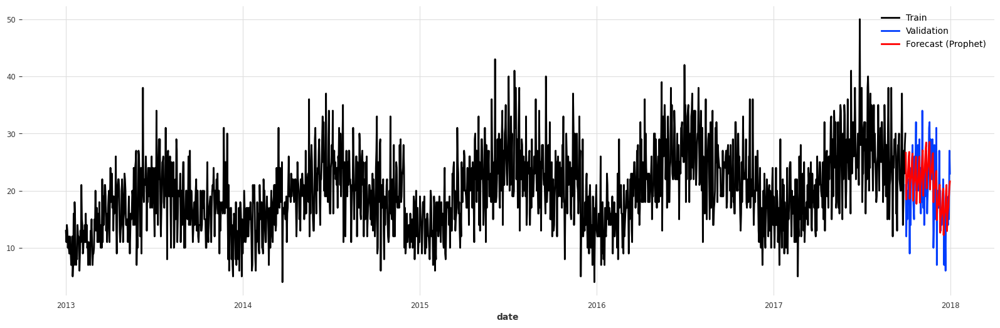

In [48]:
plt.figure(figsize=(20, 6))
train.plot(label="Train")
val.plot(label="Validation")
forecast_prophet.plot(label="Forecast (Prophet)", color="red")
plt.legend()
plt.show()

Ми побудували Prophet – модель від Facebook.

Висновок:

Prophet показала кращу точність ніж ARIMA – MAPE складає 23.8% vs 34.60%.


Модель автоматично враховує сезонність і тренди, що дозволяє їй краще адаптуватися до змін у даних.

Ми отримали порівняно хороший результат без додаткових налаштувань.


15. Натренуйте модель `RNNModel` та зробіть висновок про її якість.

In [49]:
from darts.models import RNNModel

In [ ]:
# Побудова та тренування моделі LSTM
model = RNNModel(model='LSTM', input_chunk_length=7, n_epochs=200)
model.fit(train)

# Прогнозування
forecast = model.predict(len(val))


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
2.8 K     Trainable params
0         Non-trainable params
2.8 K     Total params
0.011     Total estimated model params size (MB)
7         

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

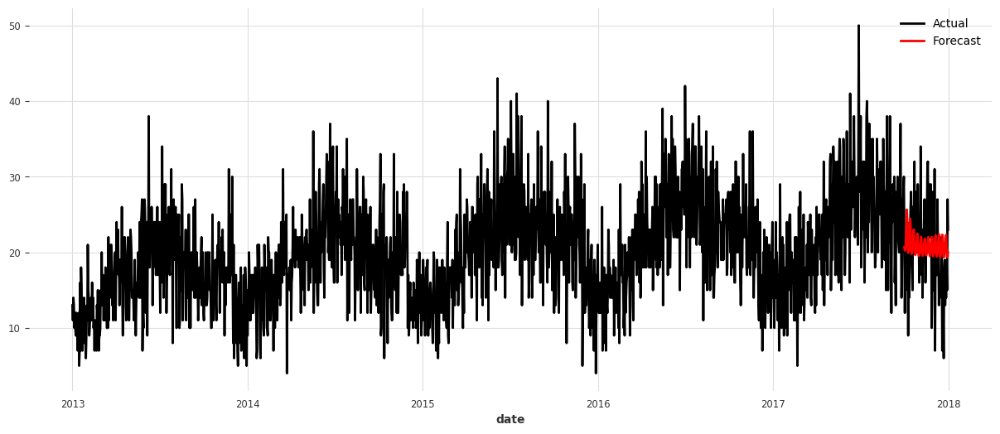

In [ ]:
# Візуалізація результатів
plt.figure(figsize=(15, 6))
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

In [ ]:
# Обчислення MAPE
mape_score = mape(val, forecast)

# Вивід результату
print(f"MAPE (RNN): {mape_score:.2f}%")

MAPE (RNN): 29.88%


Ми побудували рекурентну нейромережу (RNN) з архітектурою LSTM для прогнозування часового ряду.

input_chunk_length=7 – модель враховує 7 останніх точок (тижнева сезонність).

n_epochs=200 – модель тренується 200 епох.

Отримано результат MAPE = 29.88%.

Висновок:

Наша RNN точніша, ніж ARIMA (34.60%), але гірша, ніж  моделі Prophet (23.80%), XGBModel(22.19%) і Exponential Smoothing (28.44%).

Навчання займає більше часу, ніж у інших моделей.



Спробуємо зробити додаткові налаштування для нашої моделі.

In [50]:
from darts.utils.timeseries_generation import datetime_attribute_timeseries

# Масштабування даних
from darts.dataprocessing.transformers import Scaler
transformer = Scaler()
train_transformed = transformer.fit_transform(train)
val_transformed = transformer.transform(val)
series_transformed = transformer.transform(series)

year_series = datetime_attribute_timeseries(
    pd.date_range(start=series.start_time(), end=series.end_time(), freq=series.freq_str),
    attribute="year",
    one_hot=False,
)

In [ ]:
year_series = Scaler().fit_transform(year_series)
week_series = datetime_attribute_timeseries(
    year_series, attribute="week", one_hot=False
)

In [ ]:
covariates = year_series.stack(week_series)
cov_train, cov_val = covariates.split_after(pd.Timestamp("2017-10-01"))

In [ ]:
# Побудова та тренування моделі
model = RNNModel(
    model="LSTM",
    input_chunk_length=14,
    hidden_dim=20,
    dropout=0,
    batch_size=16,
    n_epochs=50,
    optimizer_kwargs={"lr": 1e-3},
    log_tensorboard=True,
    random_state=42,
    training_length=20,
    force_reset=True,
)
model.fit(
    train_transformed,
    future_covariates=covariates,
    val_series=val_transformed,
    val_future_covariates=covariates,
    verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.0 K  | train
6 | V               | Linear           | 21     | train
-------------------------------------------------------------
2.0 K     Trainable params
0         Non-trainable params
2.0 K     Total params
0.008     Total estimated model params size (MB)
7         

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


RNNModel(model=LSTM, hidden_dim=20, n_rnn_layers=1, dropout=0, training_length=20, input_chunk_length=14, batch_size=16, n_epochs=50, optimizer_kwargs={'lr': 0.001}, log_tensorboard=True, random_state=42, force_reset=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

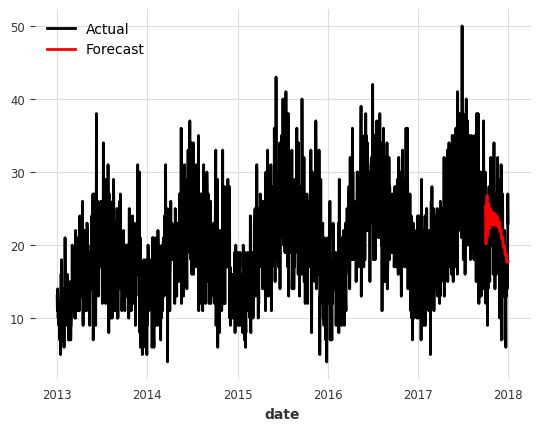

MAPE (RNNModel): 28.67%


In [ ]:
forecast_scaled = model.predict(len(val))


# Прогнозування
forecast = transformer.inverse_transform(forecast_scaled)

# Візуалізація результатів
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

from darts.metrics import mape
# Оцінка якості прогнозу (MAPE)
mape_score = mape(val, forecast)
print(f"MAPE (RNNModel): {mape_score:.2f}%")

Ми масштабували наші дані, додали ознаку year_series, тобто інформацію про те, в якому році знаходиться кожна точка та ознаку week_series, що допомагає враховувати сезонність на рівні тижнів.

Модель використовує 14 попередніх точок, щоб передбачити наступну, тренується 50 епох з 20 нейронами в прихованому шарі.

Ми навчили модель з коваріатами, тобто враховували рік і тиждень під час навчання і зробили прогноз на всю довжину валідаційного набору.


LSTM з коваріатами покращила точність прогнозу – MAPE = 28.67%.
Це краще, ніж стандартна LSTM (29.88%), але не краще, ніж показали себе інші моделі, натреновані в попередніх кроках.

Для кращого прогнозу модель потребує додаткової оптимізації.


16. Виконайте бектест для тої моделі, яка виявилась найкращою у вашому дослідженні на періоді 1 рік з передбаченнями на 1 місяць щоразу. Візуалізуйте як поводилась модель протягом бектесту, яка була точність?

In [ ]:
# Навчання моделі з масштабованими коваріатами
model_xgb.fit(train_transformed_scaled, future_covariates=train_covariates_scaled)

# Прогнозування на валідаційних даних з масштабованими коваріатами
forecast_scaled = model_xgb.predict(n=len(val_series), future_covariates=val_covariates_scaled)

# Інвертуємо масштабування для прогнозу
forecast = scaler_target.inverse_transform(forecast_scaled)

# Оцінка прогнозу
mape_XGB = mape(val, forecast)
print(f"MAPE для XGBModel: {mape_XGB:.2f}%")

MAPE для XGBModel: 22.19%


historical forecasts: 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]


MAPE для XGBModel на бектесті: 21.47%


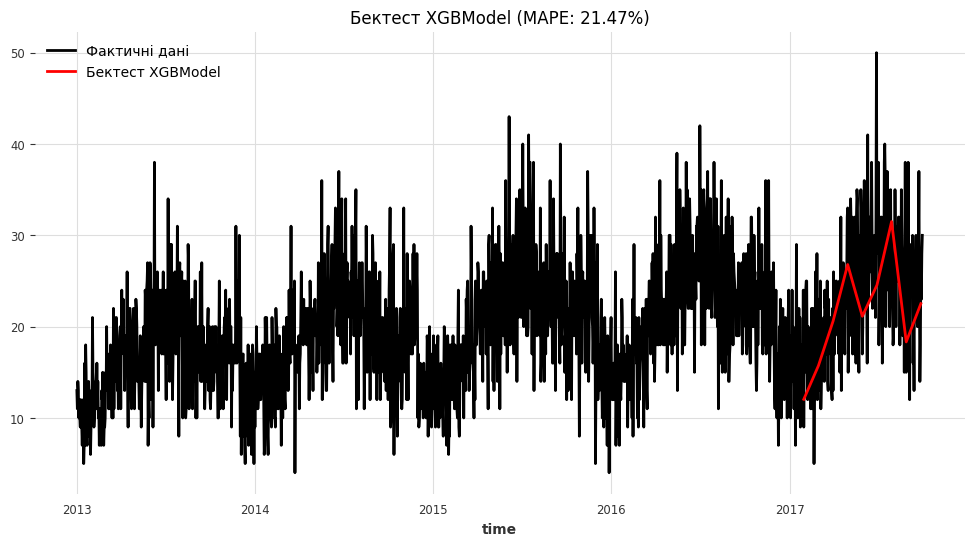

In [52]:
from darts.metrics import mape
import matplotlib.pyplot as plt

# Запускаємо бектест з прогнозами на 1 місяць (30 днів)
backtest_results = model_xgb.historical_forecasts(
    series=train_transformed_scaled,
    future_covariates=train_covariates_scaled,
    start=pd.Timestamp("2017-01-01"),  # Початок бектесту
    forecast_horizon=30,  # Прогноз на 30 днів вперед
    stride=30,  # Крок у 30 днів (оновлення моделі щомісяця)
    retrain=True,  # Перетренування на нових даних щоразу
    verbose=True
)

# Інверсія масштабування для прогнозу
backtest_results = scaler_target.inverse_transform(backtest_results)

# Оцінка точності бектесту
mape_xgb_backtest = mape(train_series.slice_intersect(backtest_results), backtest_results)
print(f"MAPE для XGBModel на бектесті: {mape_xgb_backtest:.2f}%")

# Візуалізація прогнозів
plt.figure(figsize=(12, 6))
train_series.plot(label="Фактичні дані", linewidth=2)
backtest_results.plot(label="Бектест XGBModel", color="red", linewidth=2)
plt.title(f"Бектест XGBModel (MAPE: {mape_xgb_backtest:.2f}%)")
plt.legend()
plt.show()


In [25]:
# Навчання на тренувальному наборі
model_prophet.fit(train)

# Прогнозування на довжину валідаційного набору
forecast_prophet = model_prophet.predict(len(val))
# Обчислення MAPE
mape_score = mape(val, forecast_prophet)

# Вивід результату
print(f"MAPE (Prophet): {mape_score:.2f}%")

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/03d340ge.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/c8ujbt1q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42912', 'data', 'file=/tmp/tmpvowghd7q/03d340ge.json', 'init=/tmp/tmpvowghd7q/c8ujbt1q.json', 'output', 'file=/tmp/tmpvowghd7q/prophet_modelv0uclavc/prophet_model-20250325155352.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:53:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:53:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


MAPE (Prophet): 23.80%


historical forecasts:   0%|          | 0/336 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/pze9hldb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvowghd7q/4e4zvm8l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61340', 'data', 'file=/tmp/tmpvowghd7q/pze9hldb.json', 'init=/tmp/tmpvowghd7q/4e4zvm8l.json', 'output', 'file=/tmp/tmpvowghd7q/prophet_model18ag5mpb/prophet_model-20250325155436.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:54:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:54:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   0%|          | 1/336 [00:00<02:55,  1.91it/s]INFO:prophet

MAPE = 20.37%


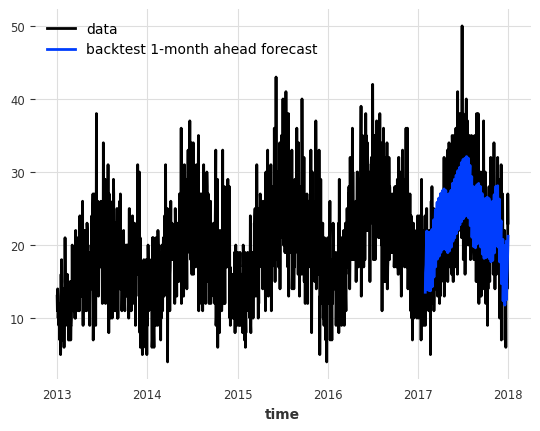

In [27]:
hfc_params = {
    "series": series,
    "start": pd.Timestamp("2017-01-01"),
    "forecast_horizon": 30,
    "verbose": True,
}

historical_fcast = model_prophet.historical_forecasts(last_points_only=True, **hfc_params)


<Axes: xlabel='time'>

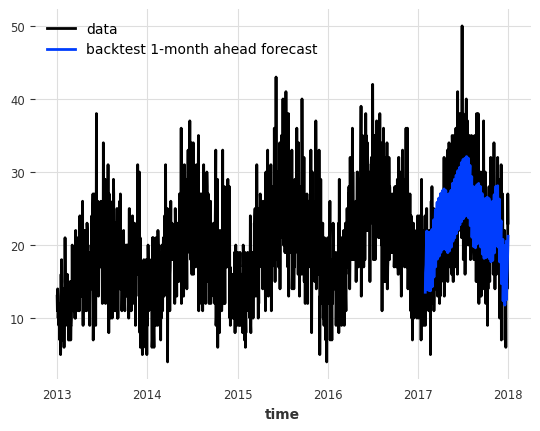

In [30]:
series.plot(label="data")
historical_fcast.plot(label="backtest 1-month ahead forecast")

In [29]:
print(f"MAPE = {mape(series, historical_fcast):.2f}%")

MAPE = 20.37%


Ми виконали бектест двох накращих моделей у нашому дослідженні:
XGBModel
Prophet
на періоді 1 року, прогнозуючи на 1 місяць (30 днів) вперед щоразу.


Prophet продемонстрував кращу точність у бектесті (20.37%), ніж XGBModel (21.47%).

Модель Prophet добре справляється з щомісячними та річними патернами завдяки своєму вбудованому механізму обліку сезонності.


XGBModel показав стабільні результати на валідації (22.19%) та бектесті (≈21.47%), модель непогано передбачає тенденції, є досить гнучкою.


Якщо важлива стабільність, Prophet кращий.


Якщо важлива адаптивність, XGBModel може бути корисною з додатковим налаштуванням.


Всю варіантивність не вгадали, але виглядає непогано!

17. На цьому етапі ви зрозуміли, як моделювати продажі одного айтему з 1 магазину. Як би ви підійшли до задачі прогнозування продажів в наступному місяці для кожного з 50 айтемів в кожному з 10 магазинів? Опишіть загальний підхід
- яку модель ви б використали
- скільки моделей ви б тренували
- обгрунтуйте свій вибір.

Я б розглядала два підходи:

Підхід 1: Індивідуальне прогнозування для кожного товару та магазину. ТОбто тренувати окрему модель для кожного товару в кожному магазині. Використовувати історичні дані та коваріати.


Моделі:

- XGBModel
- Prophet

Плюси: висока точність на індивідуальному рівні - модель оптимізується для конкретного товару та магазину, що може покращити якість прогнозу.
Легше аналізувати та інтерпретувати.

Мінуси:

Ресурсозатратно (500 окремих моделей).

Важко підтримувати та оновлювати.


Підхід 2: Глобальна модель для всіх товарів та магазинів. Тренувати одну модель для всіх товарів і магазинів. Використовувати ID товару та магазину як фічі.

Моделі:

- XGBoost
- LSTM
- Transformer

Плюси: модель навчається на всіх даних, що знижує ризик перенавчання.

Мінуси:

Потрібен великий обсяг даних для ефективного навчання.

Модель може не враховувати індивідуальні особливості товарів.